# Transformata Fouriera dla obrazów cyfrowych. Filtracja w dziedzinie częstotliwości.

## Cel ćwiczenia

- Zapoznanie z wykorzystaniem transformaty Fouriera w przetwarzaniu obrazów cyfrowych,
- Zapoznanie z pojęciem __F-obrazu__ (amplitudy i fazy),
- Zapoznanie z własnościami transformaty Fouriera,
- Zapoznanie z filtracją w dziedzinie częstotliwości.

Na jednym z poprzednich ćwiczeń zetknęliśmy się z pojęciem konwolucji.
Przykładem może być filtracja dolno- i górnoprzepustowa.
Operacja ta odpowiada mnożeniu w dziedzinie częstotliwości zgodnie z zależnością:

\begin{equation}
\mathcal{F}(g(x,y)*h(x,y)) = \mathcal{F}(g(x,y)) \cdot \mathcal{F}(h(x,y)),
\end{equation}

gdzie $\mathcal{F}$ oznacza transformatę Fouriera, a $*$ jest splotem.

Operacja filtracji w dziedzinie częstotliwości może okazać się bardziej efektywna, jeżeli operacje $fft$ oraz $ifft$ (odpowiednio: szybka transformata Fouriera -- *fast Fourier transform* -- oraz odwrotna szybka transformata Fouriera -- *inverse fast Fourier transform*) zajmą mniej czasu niż klasyczna konwolucja (zazwyczaj ma to miejsce dla dużego obrazu z dużą maską).

Sama filtracja w dziedzinie częstotliwości to mnożenie punktowe całego obrazu przez jedną maskę.

W przypadku filtracji w dziedzinie częstotliwości zakłada się, że obraz "zawija się" na brzegach, co może powodować pewne artefakty (zostanie to pokazane w trakcie ćwiczenia).

W dziedzinie częstotliwości "działają" tylko filtry liniowe.
Filtry medianowe, maksymalne, minimalne itp. nie mają swoich odpowiedników.

## Dwuwymiarowa transformata Fouriera

1. Wczytaj plik _dwieFale.bmp_ w skali szarości.
Jest to obraz powstały na podstawie następującej zależności:

\begin{equation}
L(m, n) = 128 + 127 \cdot \cos(\frac{2\pi m}{32}+\frac{3\pi}{4}) \cdot \cos(\frac{2\pi n}{8}-\frac{\pi}{2}),
\end{equation}

gdzie $m$ i $n$ są odpowiednio numerami wierszy i kolumn.

2. Do realizacji dwuwymiarowej transformaty Fouriera służy funkcja `cv2.dft`.
Ustaw flagę `flags=cv2.DFT_COMPLEX_OUTPUT`.
Wykonaj transformatę na wczytanym obrazie.
W ten sposób uzyskuje się tzw. __F-obraz__.

3. Najniższe częstotliwości znajdują się w lewym górnym rogu obrazu.
Dla celów wizualizacji (ale też przetwarzania) często wykonuje się tzw. przesunięcie F-obrazu, które powoduje, że niskie częstotliwości przesuwane są do środka obrazu.
Wykorzystaj funkcję `np.fft.fftshift`.
Jako pierwszy argument podaj wynik transformaty Fouriera.
Jako drugi argument podaj numery osi, wzdłuż których należy wykonać operację.
Pierwsza oś odnosi się do wierszy obrazu, a druga - do kolumn obrazu.
Trzecia oś z kolei to część rzeczywista (`[:, :, 0]`) lub urojona (`[:, :, 1]`).
W naszym przypadku argument powinien wyglądać tak `[0, 1]`.

4. Wyświetl wynik transformaty.
Na wspólnym wykresie umieść obraz oryginalny, amplitudę i fazę F-obrazu.
Amplitudę i fazę wyznacz za pomocą funkcji `cv2.cartToPolar`.
Pierwszym argumentem funkcji jest część rzeczywista wyniku, a drugim urojona.
Uwaga. W razie wątpliwości proszę sprawdzić rozmiary rezultatu transformaty Fouriera oraz przesunięcia.

5. Dla wizualizacji oblicz logarytm dziesiętny amplitudy: `ALog = np.log10(A + 1)`.
Wyświetl go zamiast amplitudy na poprzednim wykresie.

6. Wczytaj obrazy *kolo.bmp*, *kwadrat.bmp*, *kwadrat45.bmp*, *trojkat.bmp*.
Czy analizując F-obraz można coś powiedzieć o kierunku krawędzi obiektów?

7. Sprawdź (empirycznie) poprawność stwierdzenia:
>Dwuwymiarowa transformata Fouriera jest złożeniem dwóch transformat jednowymiarowych (wykonanych np. najpierw wierszowo, a później kolumnowo). Jednowymiarowa transformata realizowana jest za pomocą funkcji `fft` (z biblioteki _NumPy_ ).
>
Wykonaj najpierw transformatę po wierszach: `FRow = np.fft.fft(I, axis=0)` ; następnie po kolumnach: `FCol = np.fft.fft(FRow, axis=1)`.
NumPy zwraca wynik jako tablicę liczb zespolonych.
Część rzeczywistą można otrzymać w następujący sposób: `FCol.real`, a urojoną: `FCol.imag`.
Porównaj tak uzyskany wynik z rezultatem działania funkcji `cv2.dft`.
Można to zrobić wizualnie lub z wykorzystaniem funkcji `cv2.absdiff`.

In [1]:
import cv2
import os
import requests
from matplotlib import pyplot as plt
import numpy as np
import math

url = 'https://raw.githubusercontent.com/vision-agh/poc_sw/master/08_Fourier/'
fileNames = ["dwieFale.bmp", "kolo.bmp", "kwadrat.bmp", "kwadrat45.bmp", "kwadratKL.bmp", "kwadratS.bmp", "kwadratT.bmp", "lena.bmp", "trojkat.bmp", "literki.bmp", "wzorA.bmp"]

for fileName in fileNames:
  if not os.path.exists(fileName):
      r = requests.get(url + fileName, allow_redirects=True)
      open(fileName, 'wb').write(r.content)

In [2]:
# pomocnicza funkcja do uzyskania F-obrazu i przesunięcia go
def fourierTransformShift(image):
    # dwuwymiarowa transformata Fouriera
    imageF = cv2.dft(np.float32(image), flags=cv2.DFT_COMPLEX_OUTPUT)

    # przesunięcie F-obrazu
    imageFShift = np.fft.fftshift(imageF, [0, 1])
    
    return imageFShift

In [3]:
# pomocnicza funkcja do uzyskania amplitudy i fazy F-obrazu
def getMagPhase(imageFShift):
    mag, phase = cv2.cartToPolar(imageFShift[:, :, 0], imageFShift[:, :, 1])
    return mag, phase

In [4]:
# pomocnicza funkcja do wyświetlania wspólnie obrazu, amplitudy i fazy
def displayImageMagPhase(image, mag, phase, flag=False):
    fig, axs = plt.subplots(1, 3)
    fig.set_size_inches(18, 6)

    axs[0].set_title("Original image")
    axs[0].imshow(image, 'gray', vmin=0, vmax=256)
    axs[0].axis('off')

    # wybór wyświetlenia logarytmu amplitudy
    if flag:
        magLog = np.log10(mag + 1)
        axs[1].set_title("Magnitude log")
        axs[1].imshow(magLog, 'gray')
    else:
        axs[1].set_title("Magnitude")
        axs[1].imshow(mag, 'gray')
    axs[1].axis('off')

    axs[2].set_title("Phase")
    axs[2].imshow(phase, 'gray')
    axs[2].axis('off')
    
    plt.show()

(-0.5, 31.5, 31.5, -0.5)

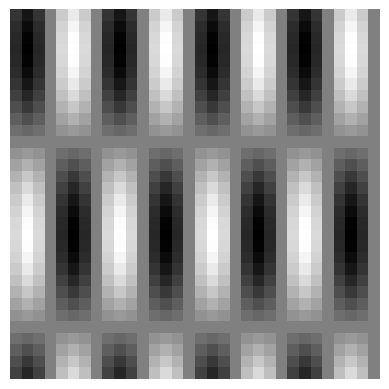

In [5]:
# wczytanie obrazu
dwieFale = cv2.imread('dwieFale.bmp', cv2.IMREAD_GRAYSCALE)

# wyświetlmy wczytany obraz
plt.imshow(dwieFale, 'gray', vmin=0, vmax=256)
plt.axis('off')

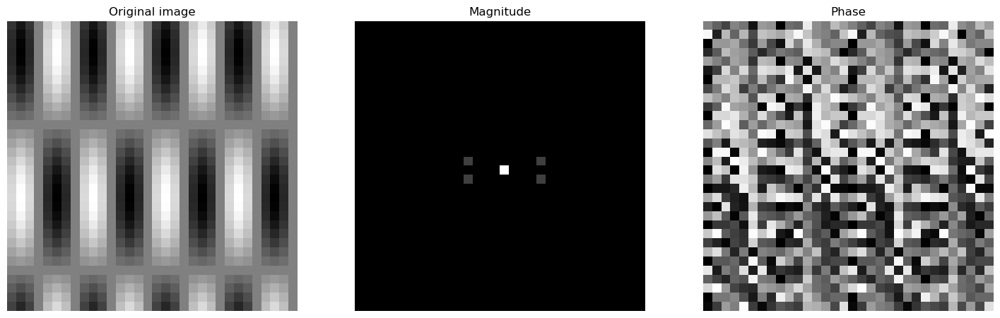

In [6]:
# transformata Fouriera + przesunięcie transformaty
dwieFaleFShift = fourierTransformShift(dwieFale)

# wyznaczanie amplitudy i fazy obrazu
mag, phase = getMagPhase(dwieFaleFShift)

# wyświetlenie transformaty
displayImageMagPhase(dwieFale, mag, phase)

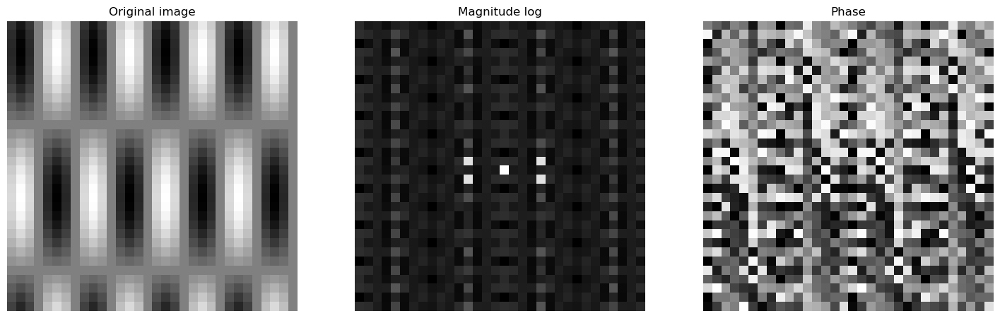

In [7]:
# wyświetlenie transformaty ze zlogarytmowaną amplitudą
displayImageMagPhase(dwieFale, mag, phase, True)

In [8]:
# wczytanie potrzebnych obrazów
kolo = cv2.imread('kolo.bmp', cv2.IMREAD_GRAYSCALE)
kwadrat = cv2.imread('kwadrat.bmp', cv2.IMREAD_GRAYSCALE)
kwadrat45 = cv2.imread('kwadrat45.bmp', cv2.IMREAD_GRAYSCALE)
trojkat = cv2.imread('trojkat.bmp', cv2.IMREAD_GRAYSCALE)

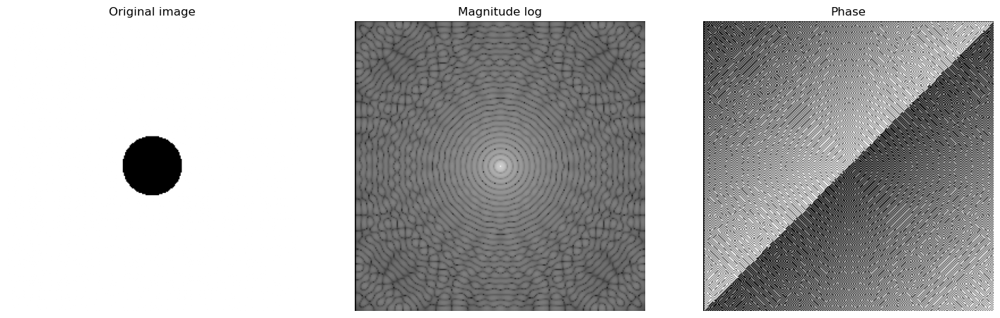

In [9]:
# analogicznie jak dla obrazu 'dwieFale.bmp'
koloFShift = fourierTransformShift(kolo)
mag, phase = getMagPhase(koloFShift)
displayImageMagPhase(kolo, mag, phase, True)

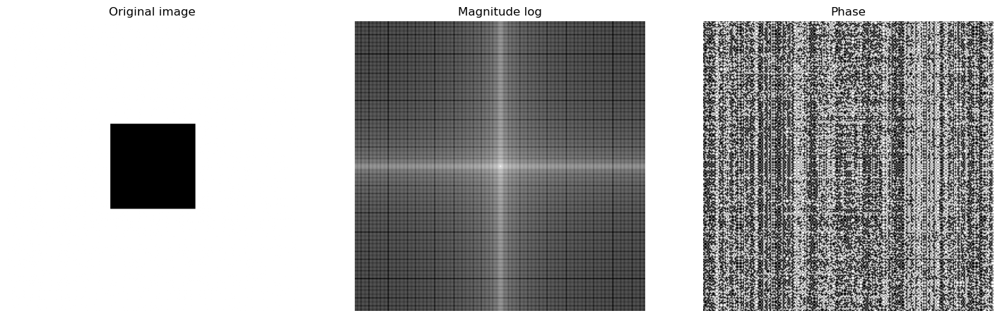

In [10]:
kwadratFShift = fourierTransformShift(kwadrat)
mag, phase = getMagPhase(kwadratFShift)
displayImageMagPhase(kwadrat, mag, phase, True)

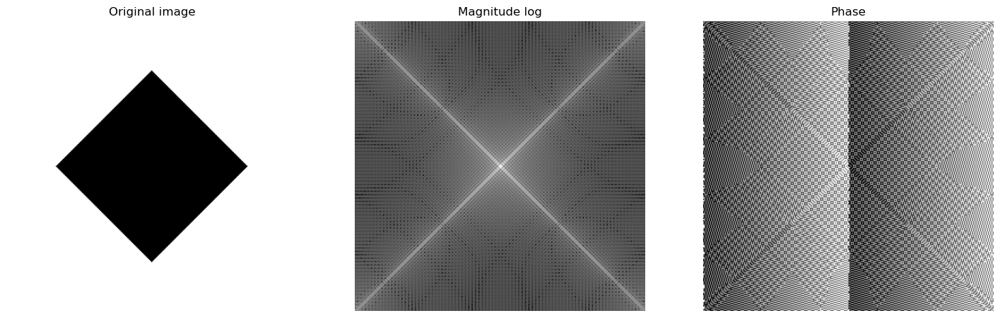

In [11]:
kwadrat45FShift = fourierTransformShift(kwadrat45)
mag, phase = getMagPhase(kwadrat45FShift)
displayImageMagPhase(kwadrat45, mag, phase, True)

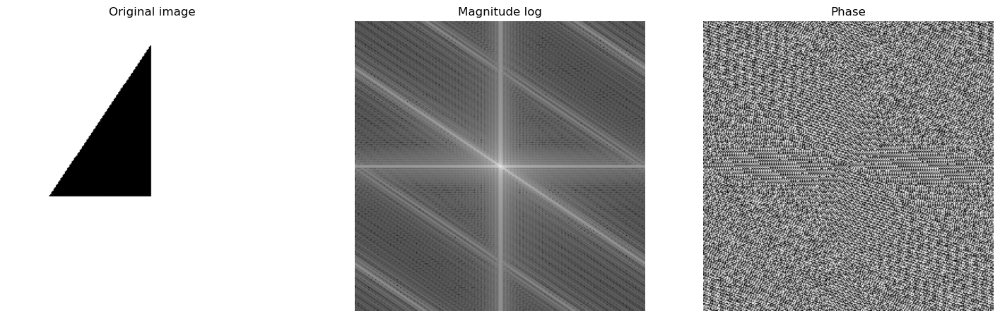

In [12]:
trojkatFShift = fourierTransformShift(trojkat)
mag, phase = getMagPhase(trojkatFShift)
displayImageMagPhase(trojkat, mag, phase, True)


---

#### Czy analizując F-obraz można coś powiedzieć o kierunku krawędzi obiektów?

Tak, w szczególności patrząc na logarytm z amplitudy dla F-obrazu. Widać to zwłaszcza dla obrazów _kolo.bmp_, _kwadrat.bmp_ oraz _kwadrat45.bmp_, natomiast dla obrazu _trojkat.bmp_ jest to mniej zauważalne.

---


In [13]:
# transformaty 1D dla obrazu `kolo.bmp`
FRow = np.fft.fft(kolo, axis=0)
FCol = np.fft.fft(FRow, axis=1)

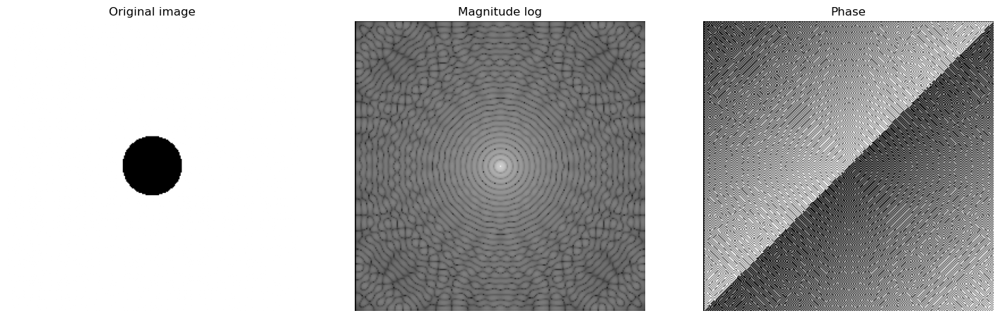

In [14]:
# stworzenie F-obrazu i jego przesunięcie
koloF1D = np.stack([FCol.real, FCol.imag], axis=2)
koloF1DShift = np.fft.fftshift(koloF1D, [0, 1])

# porównanie wizualne
mag, phase = getMagPhase(koloF1DShift)
displayImageMagPhase(kolo, mag, phase, True)


---

#### Czy dwuwymiarowa transformata Fouriera jest złożeniem dwóch transformat jednowymiarowych?

Z porównania wizualnego istotnie można stwierdzić, że dwukrotne wykonanie 1-wymiarowej transformaty Fouriera daje taki sam efekt, jak wykonanie dwuwymiarowej transformaty.

---


## Własności dwuwymiarowej transformaty Fouriera

1. Zbadaj, jak zmienia się F-obraz (amplituda i faza) podczas następujących operacji: translacja, rotacja, zmiana rozmiaru, kombinacja liniowa.
Wykorzystaj stworzony wcześniej kod.<br>
Uwaga: należy użyć przygotowanych obrazów, a nie "generować" własne.
2. Do badania translacji wykorzystaj obrazy *kwadrat.bmp* i *kwadratT.bmp*.
3. Przy badaniu rotacji wykorzystaj obrazy *kwadrat.bmp* i *kwadrat45.bmp*.
4. Przy badaniu zmiany rozmiaru wykorzystaj obrazy *kwadrat.bmp* i *kwadratS.bmp*.
5. Przy badaniu kombinacji liniowej wykorzystaj obrazy *kwadrat.bmp*, *kwadrat45.bmp* i *kwadratKL.bmp*.

In [15]:
# wczytanie pozostałych używanych w zadaniu obrazów
kwadratT = cv2.imread('kwadratT.bmp', cv2.IMREAD_GRAYSCALE)
kwadratS = cv2.imread('kwadratS.bmp', cv2.IMREAD_GRAYSCALE)
kwadratKL = cv2.imread('kwadratKL.bmp', cv2.IMREAD_GRAYSCALE)

### Translacja

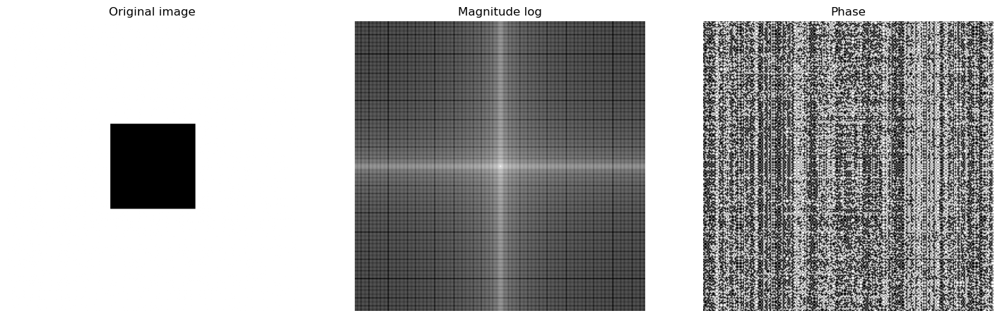

In [16]:
# wyświetlmy amplitudę i fazę dla badanych obrazów
mag, phase = getMagPhase(kwadratFShift)
displayImageMagPhase(kwadrat, mag, phase, True)

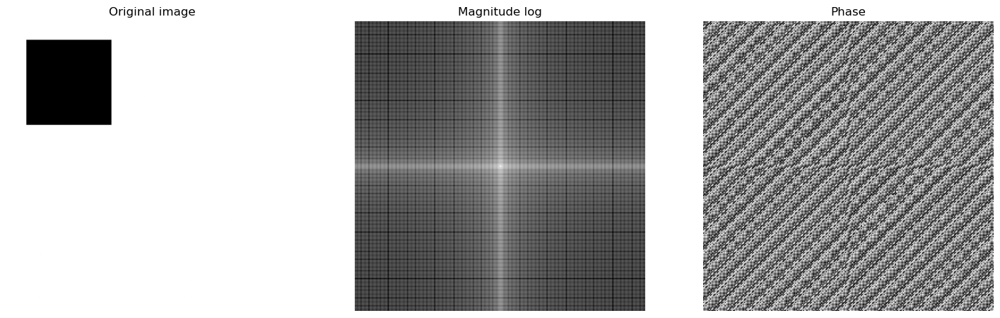

In [17]:
kwadratTFShift = fourierTransformShift(kwadratT)
mag, phase = getMagPhase(kwadratTFShift)
displayImageMagPhase(kwadratT, mag, phase, True)

### Rotacja

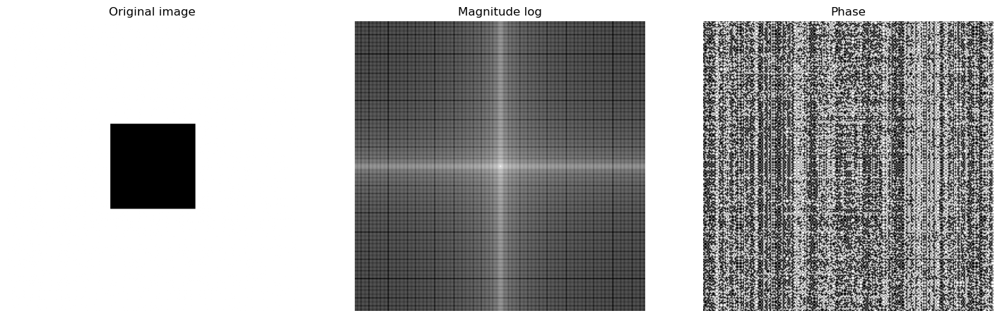

In [18]:
mag, phase = getMagPhase(kwadratFShift)
displayImageMagPhase(kwadrat, mag, phase, True)

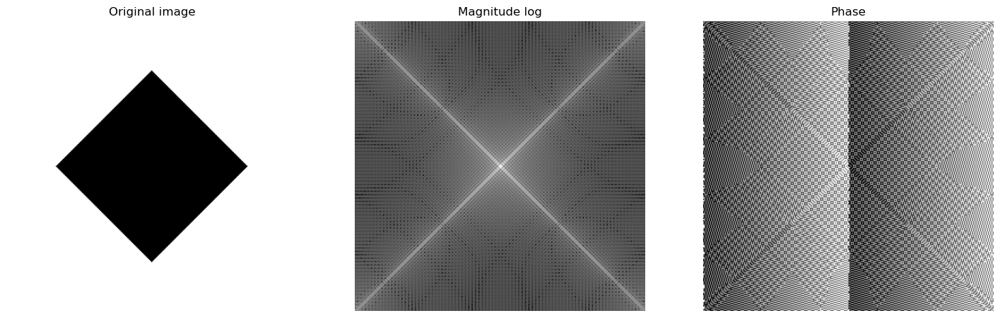

In [19]:
kwadrat45FShift = fourierTransformShift(kwadrat45)
mag, phase = getMagPhase(kwadrat45FShift)
displayImageMagPhase(kwadrat45, mag, phase, True)

### Zmiana rozmiaru

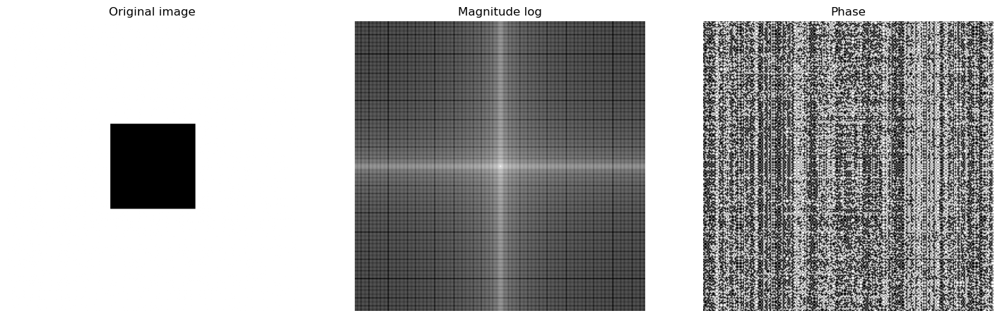

In [20]:
mag, phase = getMagPhase(kwadratFShift)
displayImageMagPhase(kwadrat, mag, phase, True)

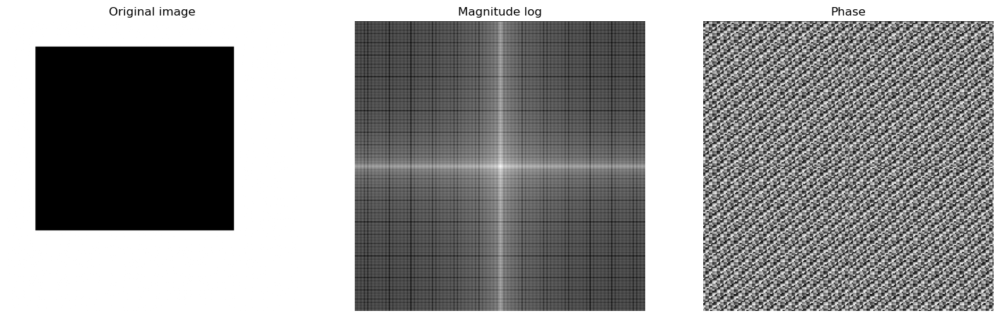

In [21]:
kwadratSFShift = fourierTransformShift(kwadratS)
mag, phase = getMagPhase(kwadratSFShift)
displayImageMagPhase(kwadratS, mag, phase, True)

### Kombinacja liniowa

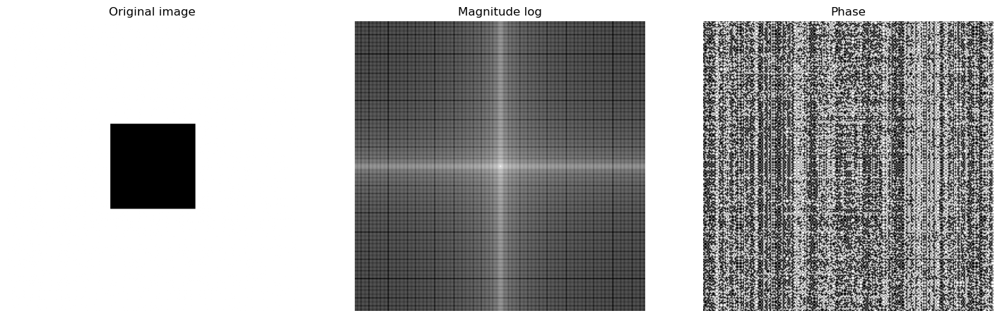

In [22]:
mag, phase = getMagPhase(kwadratFShift)
displayImageMagPhase(kwadrat, mag, phase, True)

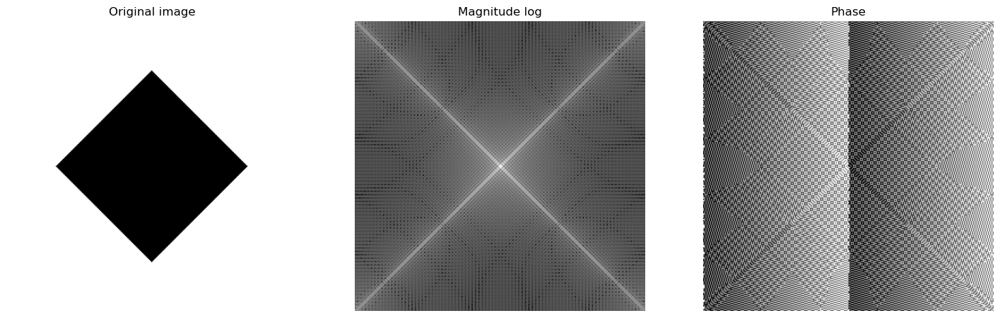

In [23]:
mag, phase = getMagPhase(kwadrat45FShift)
displayImageMagPhase(kwadrat45, mag, phase, True)

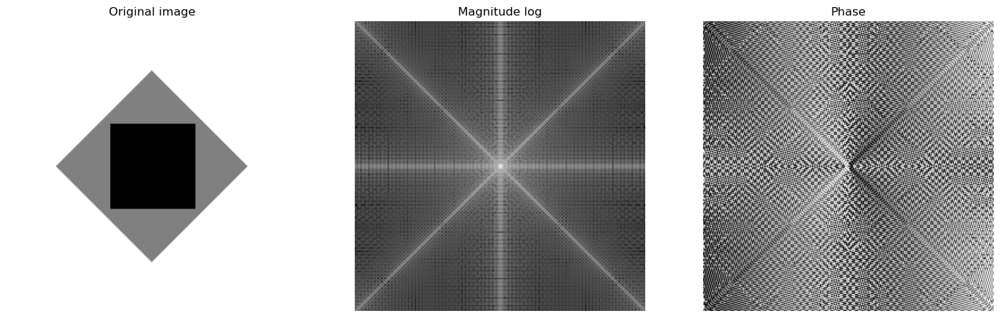

In [24]:
kwadratKLFShift = fourierTransformShift(kwadratKL)
mag, phase = getMagPhase(kwadratKLFShift)
displayImageMagPhase(kwadratKL, mag, phase, True)

## Odwrotna dwuwymiarowa transformata Fouriera

1. Wykorzystaj stworzony wcześniej kod. Wybierz dowolny obraz, np _kolo.bmp_.
2. Przed realizacją odwrotnego przekszałcenia należy wykonać odwrotne przesunięcie.
Wykorzystaj funkcję `np.fft.ifftshift`.
Pierwszym argumentem jest wynik transformaty Fouriera.
Drugim argumentem są numery osi, wzdłuż których należy wykonać operację.
3. Wykonaj odwrotną transformatę Fouriera za pomocą funkcji `cv2.idft`.
Jako drugi argument przekaż następujące flagi: `flags=cv2.DFT_SCALE | cv2.DFT_COMPLEX_OUTPUT`.
Wynik może mieć małą część urojoną przez błędy numeryczne.
Aby pozbyć się tego efektu, należy obliczyć amplitudę:
        `imgIFFT = cv2.magnitude(ifft[:, :, 0], ifft[:, :, 1])`
Następnie wynik należy zaokrąglić (`np.round`) i zrzutować do typu `uint8`.

4. Wyświetl wynik.
Sprawdź (wizualnie i poprzez odjęcie), czy obraz oryginalny i obraz po przekształceniach są takie same.

In [25]:
# pomocnicza funkcja do odwrotnego przesunięcia i przekształcenia
def inverseFourierTransformShift(imageFShift):
    # odwrotne przesunięcie
    imageFIfft = np.fft.ifftshift(imageFShift, [0, 1])
    
    # odwrotna transformata Fouriera
    imageIfft = cv2.idft(imageFIfft, flags=cv2.DFT_SCALE | cv2.DFT_COMPLEX_OUTPUT)
    
    # pozbycie się małej części urojonej
    imageIfft = cv2.magnitude(imageIfft[:, :, 0], imageIfft[:, :, 1])
    
    # zaokrąglenie wyniku
    imageIfft = np.round(imageIfft).astype(np.uint8)

    return imageIfft

(-0.5, 255.5, 255.5, -0.5)

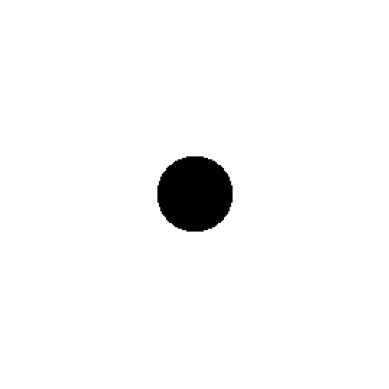

In [26]:
# odwrotna transformata Fouriera
koloIfft = inverseFourierTransformShift(koloFShift)

# wyświetlenie uzyskanego obrazu
plt.imshow(koloIfft, 'gray', vmin=0, vmax=256)
plt.axis('off')

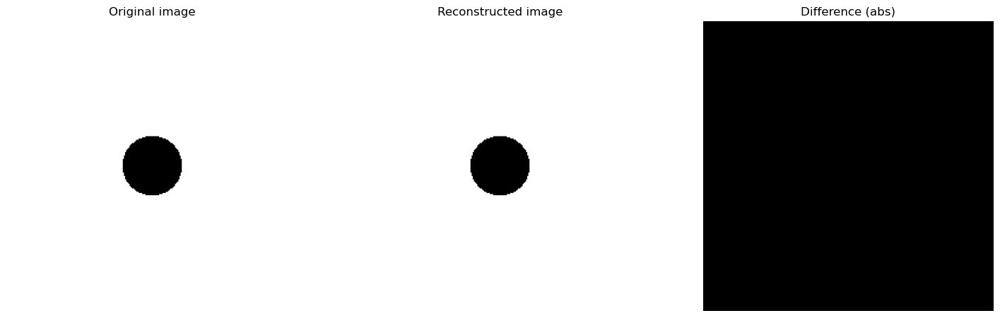

In [27]:
# porównanie wizualne i poprzez odjęcie
fig, axs = plt.subplots(1, 3)
fig.set_size_inches(18, 6)

axs[0].set_title("Original image")
axs[0].imshow(kolo, 'gray', vmin=0, vmax=256)
axs[0].axis('off')

axs[1].set_title("Reconstructed image")
axs[1].imshow(koloIfft, 'gray', vmin=0, vmax=256)
axs[1].axis('off')

axs[2].set_title("Difference (abs)")
axs[2].imshow(np.abs(kolo - koloIfft), 'gray')
axs[2].axis('off')

plt.show()


---

#### Czy obraz oryginalny i obraz po przekształceniach są takie same?

Tak, zarówno z porównania wizualnego, jak i patrząc na bezwględną różnicę między obrazami, można wyciągnąć takie wnioski.

---


## Filtracja obrazu w dziedzinie częstotliwości

1. Wczytaj obraz _lena.bmp_ w skali szarości.
Wykonaj transformatę Fouriera.
Wykorzystaj stworzony poprzednio kod.
Wyświetl obraz oryginalny, amplitudę (w skali logarytmicznej) i fazę.

2. Przeprowadź filtrację dolnoprzepustową - usuń górne częstotliwości.
Dla F-obrazu po operacji przesunięcia (`fftshift`) niskie częstotliwości leżą w jego centrum.

3. Na początku stwórz filtr "kołowy", dolnoprzepustowy.
Należy wygenerować macierze opisujące przestrzeń w dziedzinie częstotliwości.
Ich rozmiar musi być taki sam jak rozmiar przetwarzanego obrazu.


        lenaSize = I_Lena.shape
        FSpaceRows = 2 * np.fft.fftshift(np.fft.fftfreq(lenaSize[0]))
        FSpaceRowsM = np.outer(FSpaceRows, np.ones([1, lenaSize[1]]))
        FSpaceCols = 2 * np.fft.fftshift(np.fft.fftfreq(lenaSize[1]))
        FSpaceColsM = np.outer(np.ones([1, lenaSize[0]]), FSpaceCols)

   
Powyższy kod wygeneruje dwie znormalizowane macierze częstotliwości: `FSpaceRowsM` i `FSpaceColsM`.
Następnie należy wyznaczyć macierz zawierającą "odległość" od składowej stałej:

        FreqR = np.sqrt(np.square(FSpaceRowsM) + np.square(FSpaceColsM))

Uwagi:
- funkcja `fftfreq` generuje wektor częstotliwości $[-0.5, 0.5]$ o określonym rozmiarze, przy czym układ wartości jest taki, że najpierw od 0 do 0.5, a potem od -0.5 do 0,
- operacja `fftshift` zmienia ten układ na $[-0.5, 0.5]$,
- mnożenie przez 2 ustala ostatecznie zakres na $[-1, 1]$,
- operacja `outer` to tzw. iloczyn zewnętrzy dwóch wektorów - w naszym przypadku powoduje, że wektor pionowy lub poziomy jest "powielany" odpowiednią liczbę razy,
- sugeruje się, aby przyjrzeć się, jak wygląda macierz `FreqR` - czy to w debuggerze, czy poprzez wizualizację.

4. Teraz należy wybrać interesujący zakres.
Tu można zdefiniować typ filtru (dolno-, górno-, pasmowoprzepustowy):

        FilterF = FreqR <= 0.1

Filtr należy zwizualizować:

        figFilter = plt.figure()
        axsFilter = figFilter.add_subplot(projection='3d')
        axsFilter.plot_surface(FSpaceRowsM, FSpaceColsM, FilterF, rstride=1, cstride=1, cmap=plt.get_cmap('gray'), linewidth=0)
        figFilter.show()

5. Wykonaj właściwą filtrację, czyli mnożenie F-obrazu przez filtr `FilterF`.
Trzeba pamiętać, że F-obraz ma 2 kanały (rzeczywisty i urojony).
Aby mnożenie było możliwe, należy powielić filtr również na 2 kanały:

        FilterF3 = np.repeat(FilterF[:, :, np.newaxis], 2, axis=2)

6. Wykonaj operację odwrotnego przesunięcia i odwrotnej transformaty.
Oblicz wartość bezwzględną wyniku.
Wykorzystaj funkcję `cv2.magnitude`.
Pierwszym argumentem jest część rzeczywista.
Drugim argumentem jest część urojona.
Wynik wyświetl.

7. Poeksperymentuj z rozmiarem filtru (_promieniem_).
Zaimplementuj filtr górnoprzepustowy (zmiana znaku przy warunku na odległość) oraz pasmowoprzepustowy (dwa warunki na promień, połączone operatorem AND '&' ).
Wykonaj co najmniej trzy filtry i wyświetl wyniki.

8. W ten sposób zaimplementowana filtracja wprowadza pewne artefakty w postaci "pierścieni" wokół krawędzi.
Zapobiec temu zjawisku można poprzez odpowiednie "modelowanie" filtra.
W tym celu wykorzystać należy okna, np. Hamminga, Hanninga, Chebysheva (znane z przetwarzania sygnałów 1D).
Zagadnienie to jest tematem zadania domowego do tego ćwiczenia.

In [28]:
# funkcja pomocnicza do wizualizacji filtru
def visualizeFilter(FilterF, FSpaceRowsM, FSpaceColsM):
    figFilter = plt.figure()
    axsFilter = figFilter.add_subplot(projection='3d')
    axsFilter.plot_surface(FSpaceRowsM, FSpaceColsM, FilterF, rstride=1, cstride=1, cmap=plt.get_cmap('gray'), linewidth=0)
    plt.show()

In [29]:
# funkcja pomocnicza do wykonania filtracji
def applyFilter(FilterF, imageFShift):
    # powielenie filtru na 2 kanały
    FilterF3 = np.repeat(FilterF[:, :, np.newaxis], 2, axis=2)

    # przemnożenie obrazu przez filtr
    imageFShiftFilter = imageFShift * FilterF3

    return imageFShiftFilter

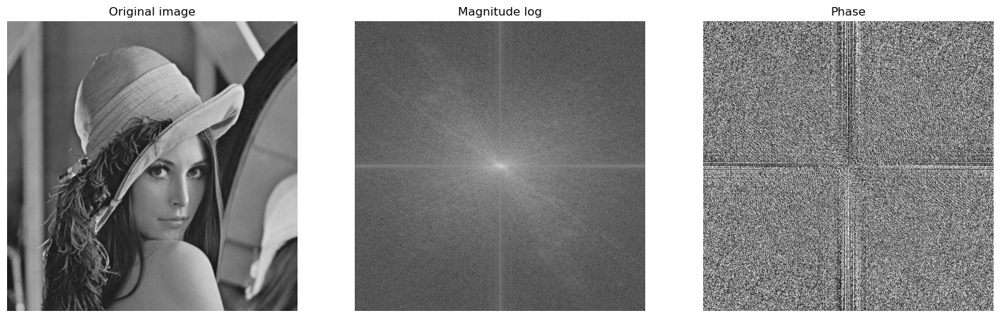

In [30]:
# wczytanie obrazu
lena = cv2.imread('lena.bmp', cv2.IMREAD_GRAYSCALE)

# transformata Fouriera
lenaFShift = fourierTransformShift(lena)

mag, phase = getMagPhase(lenaFShift)

# wyświetlenie obrazów
displayImageMagPhase(lena, mag, phase, True)

In [31]:
# zgodnie z instrukcją
lenaSize = lena.shape
FSpaceRows = 2 * np.fft.fftshift(np.fft.fftfreq(lenaSize[0]))
FSpaceRowsM = np.outer(FSpaceRows, np.ones([1, lenaSize[1]]))
FSpaceCols = 2 * np.fft.fftshift(np.fft.fftfreq(lenaSize[1]))
FSpaceColsM = np.outer(np.ones([1, lenaSize[0]]), FSpaceCols)

# macierz zawierająca "odległość" od składowej stałej
FreqR = np.sqrt(np.square(FSpaceRowsM) + np.square(FSpaceColsM))

# wyświetlmy tę macierz
FreqR

array([[1.41421356, 1.41145413, 1.40870012, ..., 1.40595157, 1.40870012,
        1.41145413],
       [1.41145413, 1.40868929, 1.40592987, ..., 1.40317589, 1.40592987,
        1.40868929],
       [1.40870012, 1.40592987, 1.40316502, ..., 1.40040561, 1.40316502,
        1.40592987],
       ...,
       [1.40595157, 1.40317589, 1.40040561, ..., 1.39764075, 1.40040561,
        1.40317589],
       [1.40870012, 1.40592987, 1.40316502, ..., 1.40040561, 1.40316502,
        1.40592987],
       [1.41145413, 1.40868929, 1.40592987, ..., 1.40317589, 1.40592987,
        1.40868929]])

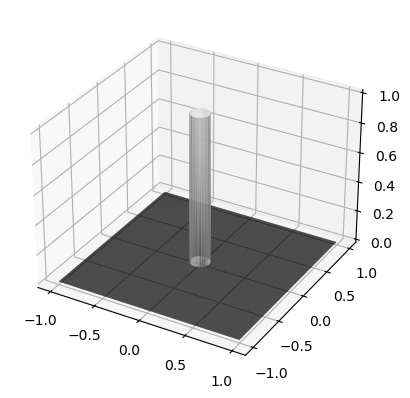

In [32]:
# filtr dolnoprzepustowy
FilterF = FreqR <= 0.1

# wizualizacja filtru
visualizeFilter(FilterF, FSpaceRowsM, FSpaceColsM)

(-0.5, 511.5, 511.5, -0.5)

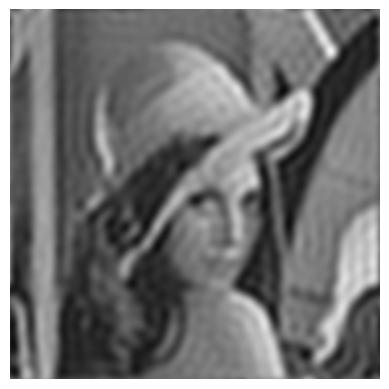

In [33]:
# wykonanie filtracji
lenaFShiftFilter = applyFilter(FilterF, lenaFShift)

# odwrotna transformata
lenaIfft = inverseFourierTransformShift(lenaFShiftFilter)

# wyświetlenie uzyskanego obrazu
plt.imshow(lenaIfft, 'gray', vmin=0, vmax=256)
plt.axis('off')

### Filtr dolnoprzepustowy, promień 0.2

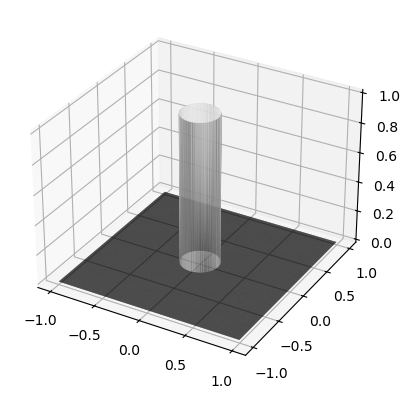

In [34]:
# filtr dolnoprzepustowy
FilterF = FreqR <= 0.2

# wizualizacja filtru
visualizeFilter(FilterF, FSpaceRowsM, FSpaceColsM)

(-0.5, 511.5, 511.5, -0.5)

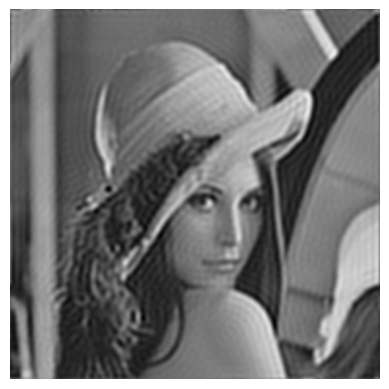

In [35]:
# analogicznie jak wcześniej
lenaFShiftFilter = applyFilter(FilterF, lenaFShift)
lenaIfft = inverseFourierTransformShift(lenaFShiftFilter)

# wyświetlenie uzyskanego obrazu
plt.imshow(lenaIfft, 'gray', vmin=0, vmax=256)
plt.axis('off')

### Filtr górnoprzepustowy, promień 0.03

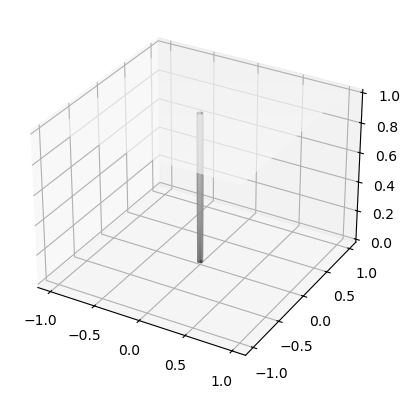

In [36]:
# filtr górnoprzepustowy
FilterF = FreqR >= 0.03

# wizualizacja filtru
visualizeFilter(FilterF, FSpaceRowsM, FSpaceColsM)

(-0.5, 511.5, 511.5, -0.5)

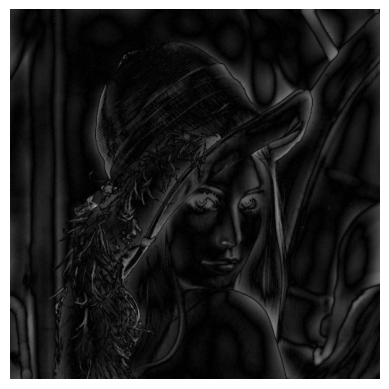

In [37]:
# analogicznie jak wcześniej
lenaFShiftFilter = applyFilter(FilterF, lenaFShift)
lenaIfft = inverseFourierTransformShift(lenaFShiftFilter)

# wyświetlenie uzyskanego obrazu
plt.imshow(lenaIfft, 'gray', vmin=0, vmax=256)
plt.axis('off')

### Filtr pasmowoprzepustowy, promienie 0.05 i 0.3

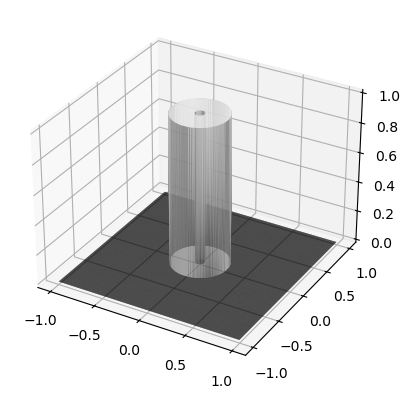

In [38]:
# filtr pasmowoprzepustowy
FilterF = np.logical_and(0.05 <= FreqR, FreqR <= 0.3)

# wizualizacja filtru
visualizeFilter(FilterF, FSpaceRowsM, FSpaceColsM)

(-0.5, 511.5, 511.5, -0.5)

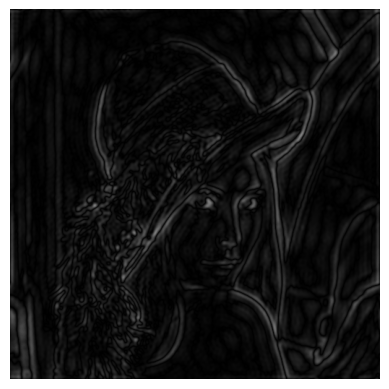

In [39]:
# analogicznie jak wcześniej
lenaFShiftFilter = applyFilter(FilterF, lenaFShift)
lenaIfft = inverseFourierTransformShift(lenaFShiftFilter)

# wyświetlenie uzyskanego obrazu
plt.imshow(lenaIfft, 'gray', vmin=0, vmax=256)
plt.axis('off')

## Implementacja wyszukiwania wzorca za pomocą FFT

1. Wczytaj w skali szarości i wyświetl obrazy *literki.bmp* i *wzorA.bmp*.

2. Wyznacz transformatę Fouriera obrazu *literki.bmp*.

3. Obróć drugi obraz o $180^\circ$.
Zastosuj funkcję `np.rot90`.
Pierwszym argumentem jest obracana macierz, a drugim liczba obrotów o $90^\circ$.

4. Należy wyznaczyć transformatę Fouriera obróconego obrazu w taki sposób, żeby miała ona taki sam rozmiar jak pierwszy obraz.
W tym celu należy zastosować *Zero Padding*.
Operacja ta polega na uzupełnieniu obrazu zerami do oczekiwanego rozmiaru.
Uzupełnij obraz zerami z **prawej** strony i z **dołu**.
W tym celu należy wykorzystać funkcję `cv2.copyMakeBorder`:
    - Pierwszym argumentem jest obraz wejściowy,
    - Drugim argumentem jest liczba wierszy u góry,
    - Trzecim argumentem jest liczba wierszy u dołu,
    - Czwartym argumentem jest liczba kolumn z lewej,
    - Piątym argumentem jest liczba kolumn z prawej,
    - Szóstym argumentem jest flaga typu wypełnienia - dla stałej wartości podaj `cv2.BORDER_CONSTANT`,
    - Siódmym, ostatnim argumentem jest wartość pikseli w ramce. Przekaż `value=0`.

5. Wyznacz transformatę Fouriera obrazu stworzonego w poprzednim punkcie.

6. Wyniki obu transformat należy przekonwertować do liczb zespolonych.
Obecnie jest to dwukanałowa macierz.
Pierwszy kanał odpowiada za część rzeczywistą, drugi kanał odpowiada za część urojoną.
Aby to osiągnąć, wystarczy wykonać działanie:


   Complex = Real + Imag * 1j

8. Przemnóż ze sobą zespolone wyniki transformat.

9. Wynik należy powrotnie przekształcić do dwukanałowej macierzy.
Aby to zrobić, wykonaj operację:

        CompMat = cv2.merge([np.real(Complex), np.imag(Complex)])

11. Wykonaj odwrotną transformatę Fouriera.
Dodaj flagę `flags=cv2.DFT_COMPLEX_INPUT`.

12. Oblicz wartość bezwzględną wyniku.

13. Wykonaj morfologiczną operację **Top-Hat**, by znaleźć maksima lokalne.
Operacja ta została dokładniej wyjaśniona w jednym z poprzednich ćwiczeń.
W tym celu wykorzystaj operację:

        cv2.morphologyEx(correlation, cv2.MORPH_TOPHAT, np.ones((3, 3), np.uint8))

15. Wyświetl obok siebie obraz wejściowy i wynik wykonanych operacji.
Czy możesz wskazać położenie wzoru na podstawie drugiego obrazu?

In [40]:
# wczytanie używanych w zadaniu obrazów
literki = cv2.imread('literki.bmp', cv2.IMREAD_GRAYSCALE)
wzorA = cv2.imread('wzorA.bmp', cv2.IMREAD_GRAYSCALE)

In [41]:
# transformata Fouriera + przesunięcie transformaty
literkiFShift = fourierTransformShift(literki)

# obrócenie o 180 stopni
wzorARot = np.rot90(wzorA, 2)

# wymiary obrazów
literkiH, literkiW = literki.shape
wzorAH, wzorAW = wzorA.shape

# uzupełnienie zerami
wzorARotPad = cv2.copyMakeBorder(wzorARot, 0, literkiH - wzorAH, 0, literkiW - wzorAW, cv2.BORDER_CONSTANT, value=0)

# transformata obrazu
wzorARotPadFShift = fourierTransformShift(wzorARotPad)

In [42]:
# konwersja do liczb zespolonych
literkiComplex = literkiFShift[:, :, 0] + literkiFShift[:, :, 1] * 1j
wzorAComplex = wzorARotPadFShift[:, :, 0] + wzorARotPadFShift[:, :, 1] * 1j

# przemnożenie transformat
literkiWzorA = literkiComplex * wzorAComplex

# dwukanałowa macierz
CompMat = cv2.merge([np.real(literkiWzorA), np.imag(literkiWzorA)])

In [43]:
# odwrotna transformata z inną flagą
CompMatIfft = np.fft.ifftshift(CompMat, [0, 1])
CompMatIfft = cv2.idft(CompMatIfft, flags=cv2.DFT_COMPLEX_INPUT)
CompMatIfft = cv2.magnitude(CompMatIfft[:, :, 0], CompMatIfft[:, :, 1])

# operacja morfologiczna Top-Hat
CompMatIfftTopHat = cv2.morphologyEx(CompMatIfft, cv2.MORPH_TOPHAT, np.ones((3, 3), np.uint8))

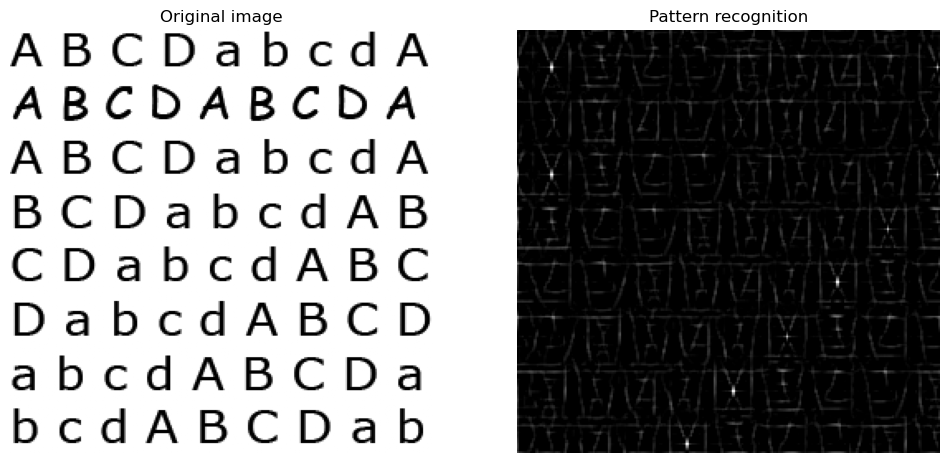

In [44]:
fig, axs = plt.subplots(1, 2)
fig.set_size_inches(12, 6)

axs[0].set_title("Original image")
axs[0].imshow(literki, 'gray', vmin=0, vmax=256)
axs[0].axis('off')

axs[1].set_title("Pattern recognition")
axs[1].imshow(CompMatIfftTopHat, 'gray')
axs[1].axis('off')

plt.show()


---

#### Czy możesz wskazać położenie wzoru na podstawie drugiego obrazu?

Tak, patrząc na jasne (mniejsze lub większe, ale wyróżniające się) kropki na drugim obrazie, odpowiadają one położeniu szukanego wzorca na pierwszym obrazie.

---
